<a href="https://colab.research.google.com/github/fralfaro/MAT281_2022/blob/main/homeworks/h1/hw_01.ipynb
" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Tarea N°01

## Instrucciones

1.- Completa tus datos personales (nombre y rol USM) en siguiente celda.


* __Nombre__: Juan Vásquez

* __Rol__: 201604608-9

2.- Debes _subir_ este archivo con tus cambios a tu repositorio personal del curso, incluyendo datos, imágenes, scripts, etc.

3.- Se evaluará:
   - Soluciones
   - Código
   - Al presionar  `Kernel -> Restart Kernel and Run All Cells` deben ejecutarse todas las celdas sin error.

## I.-  Imagenception

Desde [Wikipedia](https://es.wikipedia.org/wiki/RGB), __RGB__ (sigla en inglés de red, green, blue) es un modelo de color basado en la síntesis aditiva, con el que es posible representar un color mediante la mezcla por adición de los tres colores de luz primarios. El modelo de color RGB no define por sí mismo lo que significa exactamente rojo, verde o azul, por lo que los mismos valores RGB pueden mostrar colores notablemente diferentes en distintos dispositivos que usen este modelo de color. Aunque utilicen un mismo modelo de color, sus espacios de color pueden variar considerablemente.

Para indicar con qué proporción es mezclado cada color, se asigna un valor a cada uno de los colores primarios, de manera que el valor "0" significa que no interviene en la mezcla y, a medida que ese valor aumenta, se entiende que aporta más intensidad a la mezcla. Aunque el intervalo de valores podría ser cualquiera (valores reales entre 0 y 1, valores enteros entre 0 y 37, etc.), es frecuente que cada color primario se codifique con un byte (8 bits).

Así, de manera usual, la intensidad de cada una de las componentes se mide según una escala que va del 0 al 255 y cada color es definido por un conjunto de valores escritos entre paréntesis (correspondientes a valores "R", "G" y "B") y separados por comas.

El conjunto de todos los colores también se puede representar en forma de cubo. Cada color es un punto de la superficie o del interior de éste. La escala de grises estaría situada en la diagonal que une al color blanco con el negro.

![rgb](https://upload.wikimedia.org/wikipedia/commons/thumb/a/a9/Avl3119color4a.svg/800px-Avl3119color4a.svg.png)

Para efectos prácticos del curso, es posible representar cada pixel de una imagen con un array de 3 dimensiones, cada valor representa a una de las capas RGB. Por lo tanto, una imagen de $n \times m$ pixeles se representa como un arreglo de dimension $(n, m , 3)$ En `Python` una de las librerías de procesamiento de imágenes más utilizada es `Pillow`.

Abrir una imagen es tan fácil como:

In [1]:
# librerias

import os
import numpy as np
from PIL import Image

In [2]:
gatito = Image.open(os.path.join("images", "gatito.png"))

Notar que la variable anterior es de una clase específica de la librería.

In [3]:
type(gatito)

PIL.PngImagePlugin.PngImageFile

Para ver la imagen en Jupyter puedes utilizar la misma técnica que con los `pd.DataFrames`, es decir:

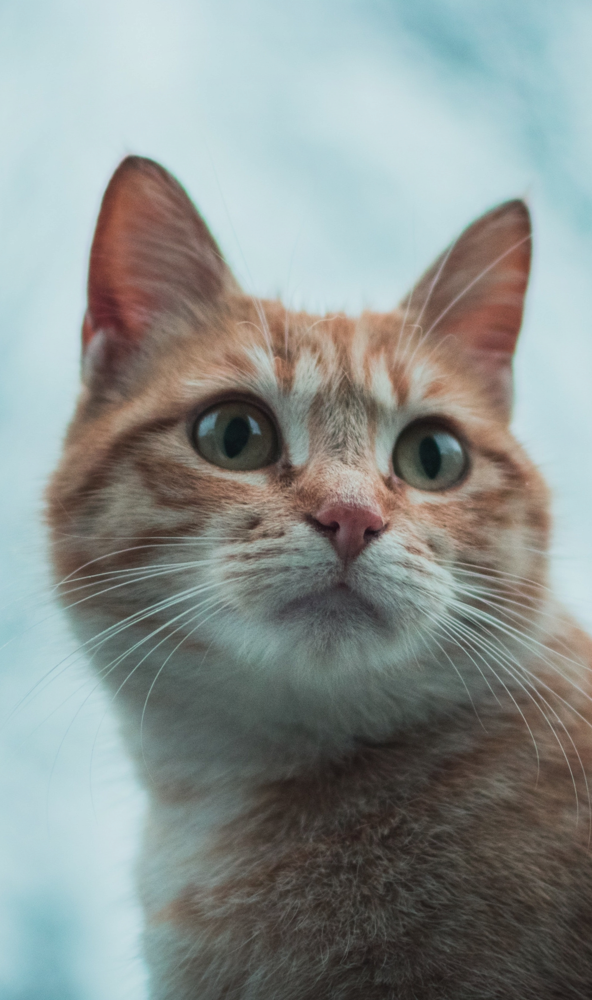

In [4]:
gatito

Para tener su representación en un array podemos utilizar el constructor `np.array` con argumento la imagen.

In [5]:
gatito_np = np.array(gatito)
print(f"Dimension de la imagen gatito: {gatito_np.shape}.\n")
print(f"Al convertir a np.ndarry el tipo de elementos es {gatito_np.dtype}.\n")
print(gatito_np)

Dimension de la imagen gatito: (2160, 1280, 3).

Al convertir a np.ndarry el tipo de elementos es uint8.

[[[179 211 215]
  [179 211 215]
  [179 209 215]
  ...
  [171 201 209]
  [171 201 209]
  [169 199 207]]

 [[181 213 217]
  [181 213 217]
  [181 211 217]
  ...
  [173 203 211]
  [173 203 211]
  [171 201 209]]

 [[179 211 215]
  [179 211 215]
  [181 211 217]
  ...
  [173 203 211]
  [173 203 211]
  [173 203 211]]

 ...

 [[125 179 190]
  [123 177 188]
  [129 183 194]
  ...
  [ 41  36  33]
  [ 43  38  35]
  [ 45  40  37]]

 [[127 181 192]
  [125 179 190]
  [127 181 192]
  ...
  [ 43  38  37]
  [ 43  38  37]
  [ 45  40  37]]

 [[125 179 190]
  [123 177 188]
  [123 177 188]
  ...
  [ 49  44  43]
  [ 45  40  37]
  [ 43  38  35]]]


### 1.- Encontrando la imagen oculta

La imagen anterior tiene una imagen oculta, el ejercicio corresponde en descifrarlo. Las instrucciones son las siguientes:

1.1 Crear una lista vacía declarada como `secret_list`.

In [6]:
secret_list = list() # crea la lista vacía

1.2 Iterar por cada uno de los canales RGB (`gatito_np.shape[2]`) y en cada iteración:
 * Crear un arreglo temporal llamado `secret_aux` de dos dimensiones, de la misma dimension de pixeles de la imagen `gatito` y que tenga valores enteros, `0` si el valor de la capa de `gatito_np` es par y `1` si es impar. 
  - No iterar por filas y columnas.
  - Utilizar la operación módulo `%`. 
  - En la i-ésima iteración de los canales la capa de `gatito_np` es `gatito_np[:, :, i]`.
        
        
 * Escalar `secret_aux` a valores 0 y 255.
    
 * Cambiar el `dtype` de `secret_aux` a `np.uint8` (utilize el méteodo `astype()`).
            
 * Agregue `secret_aux` a `secret_list`.
    
Al final de la iteración `secret_list` debe tener solo tres arreglos.

**Observación:** recuerde que puede aplicar operaciones directo a un arreglo de numpy.

In [7]:
for channel in range(0, gatito_np.shape[2]): # recorre los canales
  secret_aux = gatito_np[:,:,channel] # selecciona uno de los canales
  secret_aux = (secret_aux % 2)*255 # clasifica por impar/par y multiplica por 255
  secret_aux.astype(np.uint8) # cambia el tipo a uint8
  secret_list.append(secret_aux) # agrega a la lista vacía creada

In [8]:
print(f"secret_list tiene {len(secret_list)} elementos")
print(secret_list[0].shape) # conocer la dimensión nxm de los pixeles para verificar 

secret_list tiene 3 elementos
(2160, 1280)


1.3 Crear la variable `secret_np` concatenando horizontalmente los elementos de `secret_list`.

In [9]:
secret_np = np.concatenate([secret_list[0], secret_list[1], secret_list[2]], axis = 1) # concatena horizontalmente -> axis=1
secret_np.shape # verificar número de columnas 3x1280=3840

(2160, 3840)

1.4 Crear el objeto `secret_img` utilizando el arreglo `secret_np`, asegurar que los valores estén entre 0 y 255, y que el dtype sea `np.uint8`, con el método `Image.fromarray` con argumento `mode="L"`

In [10]:
np.unique(secret_np)

array([  0, 255], dtype=uint8)

In [11]:
secret_np.dtype

dtype('uint8')

In [12]:
secret_img = Image.fromarray(secret_np, mode='L')

Ahora puedes ver el resultado!

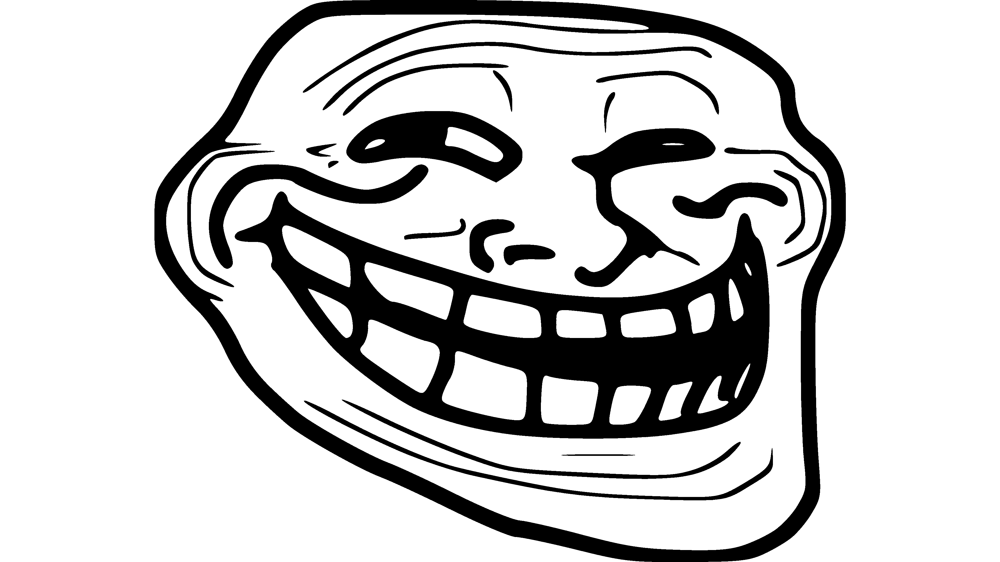

In [13]:
secret_img

In [14]:
print('JAJAJA NOTABLE')

JAJAJA NOTABLE


**Comentarios:** La serie de datos muestra un arreglo tridimensional solo con matrices de 3x3 y nxm pixeles (n,m,3), dentro de cada matriz de 3x3 se asignan colores que son identificados con números entre 0 y 255,
la información contenida en cada sub matriz de 3x3 identifica el color del pixel mezclando los colores contenidas en ésta.
La metodología de esta pregunta intenta descifrar una imagen oculta en la imagen del gatito, para ello, los valores que son impares son escalados a 255, representando el color negro,
y los valores pares quedan con valor cero, es decir, son de color blanco. Luego de concatenar y ajustar la matriz de orden nxm, ésta deja de tener las sub matrices ya que 
cada pixel se deja de formar por una mezcla de colores, y solo es caracterizado por negro (255) o blanco (0). Finalmente, concatenadas las matrices pertenecientes a los 3 canales
se logra el resultados de la figura anterior

### 2.- Escondiendo una nueva imagen

Es tu turno, ahora tu esconderás una imagen. Las instrucciones son las siguientes:

2.1 Selecciona una imagen de 2160 x 3840 pixeles (a.k.a resolución 4k), lo importante es que sea solo en blanco y negro, en la carpeta `images` se disponibiliza como ejemplo la imagen `black_and_white_example.jpg` y crea una variable llamada `my_img` leyendo la imagen seleccionada con `Image.open()`.

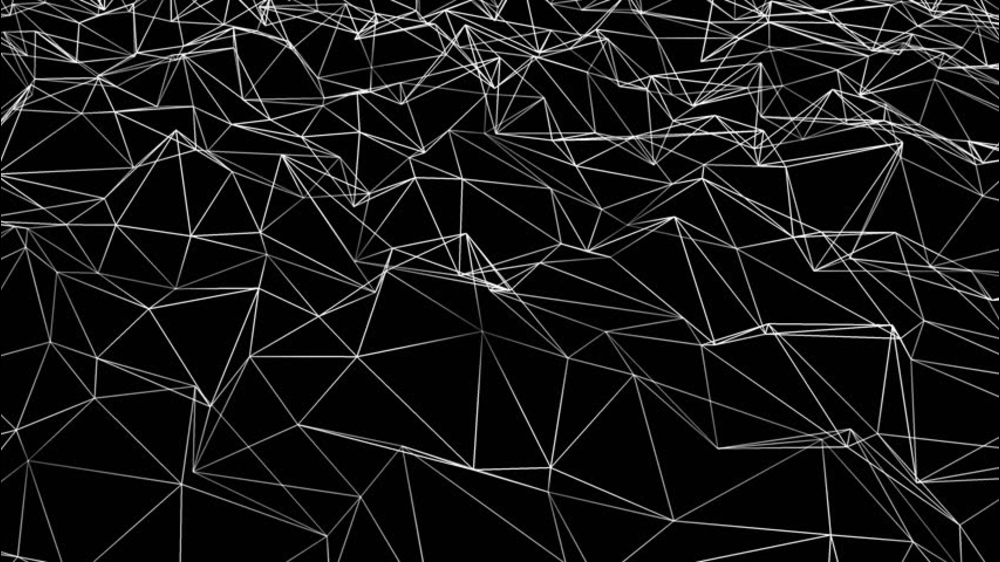

In [15]:
my_img = Image.open(os.path.join("images","black_and_white_example.jpg")) #une varios componentes
my_img

2.2 Crea un arreglo llamado `my_img_np` utilizando `my_img` y el método `np.array()`.
    * Es importante que `my_img_np.shape` sea `(2160, 3840)`, es decir, que solo sea de dos dimensiones. Esto porque es una imagen en blanco y negro, no necesitando el modelo RGB.

In [16]:
my_img_np = np.array(my_img)
print(my_img_np.shape) # verifica dimensiones

(2160, 3840)


2.3 Crear la variable `my_img_np_aux` utilizando un _umbral_ con tal de que:
    - 1: Si el valor del pixel es mayor  al _umbral_.
    - 0: Si el valor del pixel es menor o igual al _umbral_.
    - El `dtype` debe ser `np.uint8`.
    - Para `black_and_white_example.jpg` un umbral adecuado es `20`.

In [17]:
umbral = 20
my_img_np_aux = np.where(my_img_np > umbral, 1, my_img_np*0) # condicionante
my_img_np_aux.dtype # tipo de formato

dtype('uint8')

Puedes probar que tan bien quedó la imagen con la siguiente linea. Si crees que no se ve bien, puedes cambiar el _umbral_.

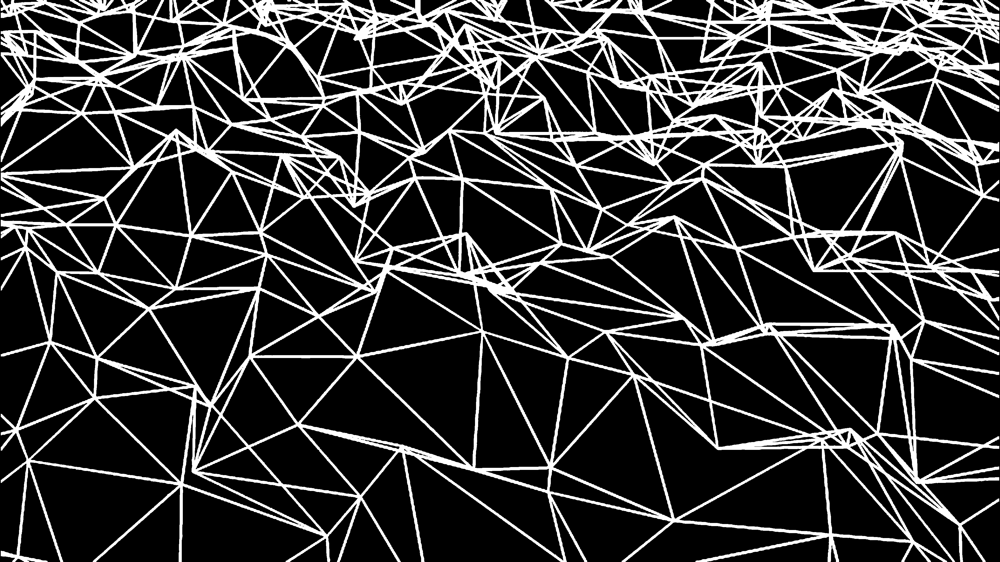

In [18]:
Image.fromarray(my_img_np_aux * 255)

2.4 Dividir la imagen en tres arreglos de tamaño (2160, 1280) y guardarlos en una lista con el nombre `my_img_split`. Hint: Revisa en la documentación de `numpy`.

In [19]:
my_img_split = np.split(my_img_np_aux, 3, axis=1) # divide una matriz en sub matrices, 3 nro de matrices, axis=1 columnas
my_img_split

[array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 1],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[0, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)]

Revisa utilizando la siguiente iteración.

In [20]:
for img_array in my_img_split:
    print(img_array.shape)

(2160, 1280)
(2160, 1280)
(2160, 1280)


2.5 La imagen donde se esconderá tu imagen selecionada está en la carpeta `images` con el nombre `gatito_original.png`, que sospechosamente es de 2160 x 1280 pixeles. Carga la imagen en la variable `cat` y luego crea arreglo `cat_np` utilizando `cat`. Verifica que `cat_np.shape = (2160, 1280, 3)`.

In [21]:
cat = Image.open(os.path.join("images", "gatito_original.png"))
cat_np = np.array(cat) # arreglo
print(cat_np.shape)

(2160, 1280, 3)


2.6 Convierte todos los valores de `cat_np` a valores pares. Esto lo puedes hacer sumando 1 a cada valor de arreglo si es impar

In [22]:
cat_np = np.where(cat_np % 2 == 0, cat_np, cat_np + 1) # condicionante
cat_np # verificar que todos sean pares

array([[[178, 210, 214],
        [178, 210, 214],
        [178, 208, 214],
        ...,
        [170, 200, 208],
        [170, 200, 208],
        [168, 198, 206]],

       [[180, 212, 216],
        [180, 212, 216],
        [180, 210, 216],
        ...,
        [172, 202, 210],
        [172, 202, 210],
        [170, 200, 208]],

       [[178, 210, 214],
        [178, 210, 214],
        [180, 210, 216],
        ...,
        [172, 202, 210],
        [172, 202, 210],
        [172, 202, 210]],

       ...,

       [[124, 178, 190],
        [122, 176, 188],
        [128, 182, 194],
        ...,
        [ 40,  36,  32],
        [ 42,  38,  34],
        [ 44,  40,  36]],

       [[126, 180, 192],
        [124, 178, 190],
        [126, 180, 192],
        ...,
        [ 42,  38,  36],
        [ 42,  38,  36],
        [ 44,  40,  36]],

       [[124, 178, 190],
        [122, 176, 188],
        [122, 176, 188],
        ...,
        [ 48,  44,  42],
        [ 44,  40,  36],
        [ 42,  38,  34]]

2.7 Itera por canal RGB de `cat_np` y en cada capa suma los valores de uno de los arreglos de `my_img_split`.

In [23]:
for channel in range(cat_np.shape[2]): # recorre los canales de 0 a 2
    cat_np[:, :, channel] += my_img_split[channel] # suma los valores de uno de los arreglos

2.8 Crea una variable llamada `cat_secret_im` con `Image.fromarray` y la variable `cat_np` (que ya ha sido modificada). Luego guarda la imagen en la carpeta `images` con el nombre `my_secret.png`.

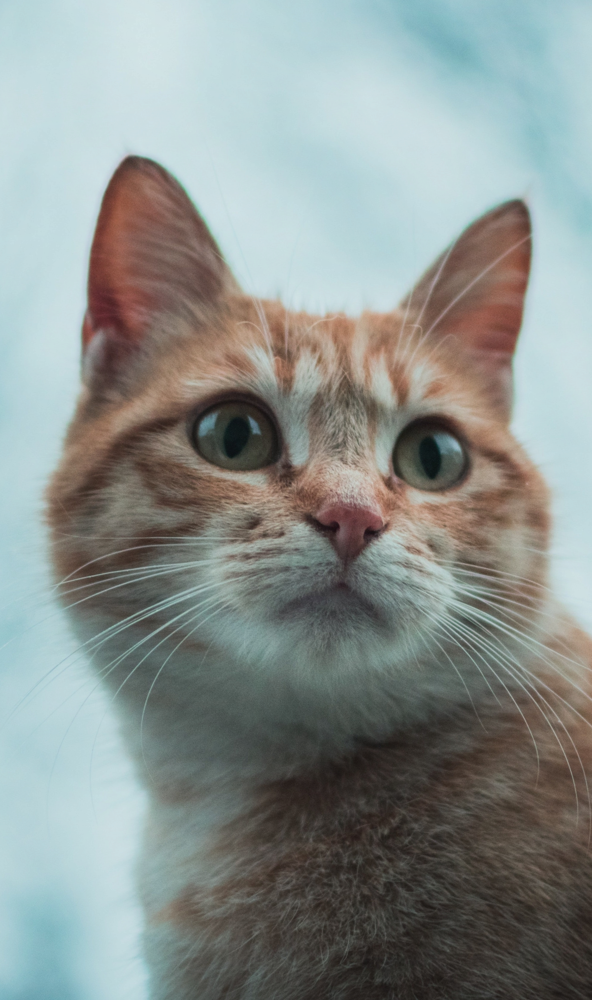

In [24]:
cat_secret_im = Image.fromarray(cat_np)
cat_secret_im.save('images/my_secret.png')
cat_secret_im

2.9 Crea una función llamada `imagenception()` que como argumento tenga la ruta de la imagen que quieres descifrar y que descifre la imagen secreta recientemente creada. Hint: Utiliza todos los pasos de la primera parte. 

In [25]:
def imagenception(filepath):
    imagen = Image.open(filepath) # abre la imagen
    lista = np.array(imagen) # crea la matriz de colores de la imagen
    secret_list = []
    for channel in range(lista.shape[2]):
        secret_aux = np.where(lista[:, :, channel] % 2 == 1, 255, 0) #asigna si es impar 255, sino 0
        secret_aux = secret_aux.astype(np.uint8) # cambia a uint8
        secret_list.append(secret_aux) # se agrega a la lista secreta
    secret_np = np.concatenate(secret_list, axis=1) # une el diccionario
    secret_img = Image.fromarray(secret_np, mode = "L") # crea el objeto secret_img con el arreglo secret_np
    return secret_img

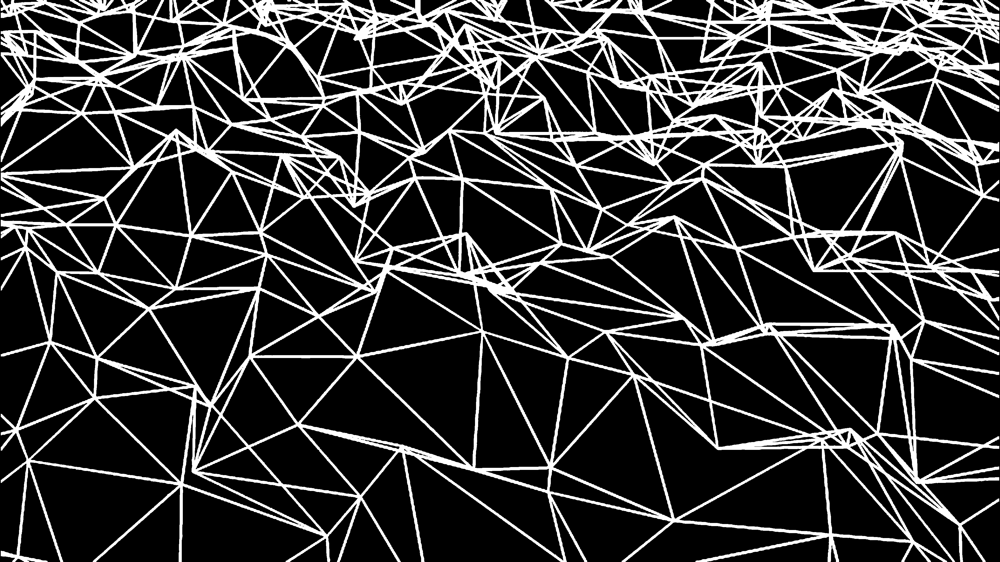

In [26]:
my_secret_img = imagenception(os.path.join("images", "my_secret.png"))
my_secret_img

## II.- Analizando la Felicidad

<img src="https://static01.nyt.com/images/2019/09/29/opinion/sunday/29HolsonStill/29HolsonStill-popup.jpg" width="480" height="360" align="center"/>

Este ejercicio es netamente análisis de datos, tratando de abarcar problemas típicos como la lectura de datos, corrección de errores, métricas agrupadas, unión de datos, etc. Utilizaremos un conjunto de datos llamado __World Happiness Report__ disponible en el siguiente [link](https://www.kaggle.com/unsdsn/world-happiness), de donde se puede obtener información al respecto.

#### Context
The World Happiness Report is a landmark survey of the state of global happiness. The first report was published in 2012, the second in 2013, the third in 2015, and the fourth in the 2016 Update. The World Happiness 2017, which ranks 155 countries by their happiness levels, was released at the United Nations at an event celebrating International Day of Happiness on March 20th. The report continues to gain global recognition as governments, organizations and civil society increasingly use happiness indicators to inform their policy-making decisions. Leading experts across fields – economics, psychology, survey analysis, national statistics, health, public policy and more – describe how measurements of well-being can be used effectively to assess the progress of nations. The reports review the state of happiness in the world today and show how the new science of happiness explains personal and national variations in happiness.

#### Content
The happiness scores and rankings use data from the Gallup World Poll. The scores are based on answers to the main life evaluation question asked in the poll. This question, known as the Cantril ladder, asks respondents to think of a ladder with the best possible life for them being a 10 and the worst possible life being a 0 and to rate their own current lives on that scale. The scores are from nationally representative samples for the years 2013-2016 and use the Gallup weights to make the estimates representative. The columns following the happiness score estimate the extent to which each of six factors – economic production, social support, life expectancy, freedom, absence of corruption, and generosity – contribute to making life evaluations higher in each country than they are in Dystopia, a hypothetical country that has values equal to the world’s lowest national averages for each of the six factors. They have no impact on the total score reported for each country, but they do explain why some countries rank higher than others.


### 2.1 Lectura de datos

In [27]:
# libraries
import os
import pandas as pd
pd.set_option("display.max_columns", 999)  # Permite mostrar hasta 999 columnas de un DataFrame en Jupyter.

En la carpeta `data/world-happiness` se disponen de tres archivos, uno por cada reporte anual (años 2015, 2016 y 2017). No es de sorprender que envíen un archivo por año (podría ser mensual, semestral, etc.), lo imortante es ser capaces de leer una cantidad __variable__ de archivos al mismo tiempo. Una buena práctica es crear un diccionario de dataframes.

In [28]:
# Comprehension dictionary

df_dict = {
    year: pd.read_csv(os.path.join("data", "world-happiness", f"{year}.csv"))
    for year in [2015, 2016, 2017]
}
df_dict[2016].info() # información del contenido

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 157 entries, 0 to 156
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country                        157 non-null    object 
 1   Region                         157 non-null    object 
 2   Happiness Rank                 157 non-null    int64  
 3   Happiness Score                157 non-null    float64
 4   Lower Confidence Interval      157 non-null    float64
 5   Upper Confidence Interval      157 non-null    float64
 6   Economy (GDP per Capita)       157 non-null    float64
 7   Family                         157 non-null    float64
 8   Health (Life Expectancy)       157 non-null    float64
 9   Freedom                        157 non-null    float64
 10  Trust (Government Corruption)  157 non-null    float64
 11  Generosity                     157 non-null    float64
 12  Dystopia Residual              157 non-null    flo

Por ejemplo, se puede acceder al DataFrame asociado al archivo `data/world-happiness/2016.csv` de la siguiente manera:

In [29]:
df_dict[2017].head()

,Country,Happiness Rank,Happiness Score,Whisker high,Whisker low,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Generosity,Trust (Government Corruption),Dystopia Residual
0,Norway,1,7.537,7.594445,7.479556,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027
1,Denmark,2,7.522,7.581728,7.462272,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707
2,Iceland,3,7.504,7.622030,7.385970,1.480633,1.610574,0.833552,0.627163,0.475540,0.153527,2.322715
3,Switzerland,4,7.494,7.561772,7.426227,1.564980,1.516912,0.858131,0.620071,0.290549,0.367007,2.276716
4,Finland,5,7.469,7.527542,7.410458,1.443572,1.540247,0.809158,0.617951,0.245483,0.382612,2.430182


In [30]:
df_dict[2017].describe(include="all").fillna("").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Country,155,155,Zambia,1,,,,,,,
Happiness Rank,155.0,,,,78.0,44.888751,1.0,39.5,78.0,116.5,155.0
Happiness Score,155.0,,,,5.354019,1.13123,2.693,4.5055,5.279,6.1015,7.537
Whisker high,155.0,,,,5.452326,1.118542,2.864884,4.608172,5.370032,6.1946,7.62203
Whisker low,155.0,,,,5.255713,1.14503,2.521116,4.374955,5.193152,6.006527,7.479556
Economy (GDP per Capita),155.0,,,,0.984718,0.420793,0.0,0.663371,1.064578,1.318027,1.870766
Family,155.0,,,,1.188898,0.287263,0.0,1.042635,1.253918,1.414316,1.610574
Health (Life Expectancy),155.0,,,,0.551341,0.237073,0.0,0.369866,0.606042,0.723008,0.949492
Freedom,155.0,,,,0.408786,0.149997,0.0,0.303677,0.437454,0.516561,0.658249
Generosity,155.0,,,,0.246883,0.13478,0.0,0.154106,0.231538,0.323762,0.838075


Una pequeña descripción de las columnas

* `Country` Name of the country.
* `Region` Region the country belongs to.
* `Happiness Rank` Rank of the country based on the Happiness Score.
* `Happiness Score` A metric measured in 2015 by asking the sampled people the question: "How would you rate your happiness on a scale of 0 to 10 where 10 is the happiest."
* `Standard Error` The standard error of the happiness score.
* `Economy (GDP per Capita)` The extent to which GDP contributes to the calculation of the Happiness Score.
* `Family` The extent to which Family contributes to the calculation of the Happiness Score
* `Health (Life Expectancy)` The extent to which Life expectancy contributed to the calculation of the Happiness Score
* `Freedom` The extent to which Freedom contributed to the calculation of the Happiness Score.
* `Trust (Government Corruption)` The extent to which Perception of Corruption contributes to Happiness Score.
* `Generosity` The extent to which Generosity contributed to the calculation of the Happiness Score.
* `Dystopia Residual` The extent to which Dystopia Residual contributed to the calculation of the Happiness Score.

Notar que los conjuntos de datos no poseen las mismas columnas, por lo tanto, solo se trabajarán con las columnas en común y posteriormente agregaremos el año con tal de concatenar los tres conjuntos.

In [31]:
from functools import reduce
intersection_columns = reduce(np.intersect1d, [df_i.columns.values for df_i in df_dict.values()]).tolist() + ["Year"]
print(intersection_columns)

['Country', 'Dystopia Residual', 'Economy (GDP per Capita)', 'Family', 'Freedom', 'Generosity', 'Happiness Rank', 'Happiness Score', 'Health (Life Expectancy)', 'Trust (Government Corruption)', 'Year']


Explica con tus palabras las operaciones que se realizaron para obtener la variable `intersection_columns`.

__Respuesta:__  < df.values permite conocer los valores de cada una de la serie de datos, estos valores se fueron recorriendo a través de la variable df_i y luego se obtiene una lista de nombres de cada columna a través de df_i.columns.values. Como son 3 elementos, son intersectados a través de np.intersect1d para reducir y obtener los elementos en común, a esta lista se le agrega la columna "year". >

### 2.2 Concatenación y procesado

Define el DataFrame `happiness` tal que:

* Sea la concatenación de los dataframes de `df_dict`
    - Nota que en la documentación de `pd.concat` puedes entregar como argumento directamente un diccionario.
    - No ordenes los _axis_ (ver documentación).
    - Los nombres de los _levels_ para los multi-index resultante deben ser `["Year", "drop_me"]`.
* Aplica el método `drop_level` con tal de eliminar el nivel del multi-index llamado `drop_me`.
* Resetea los índices.
* Selecciona solo las columnas de la lista `intersection_columns`.
* Los nombres de las columnas deben estar en minísculas, reemplazar espacios por guiones bajos (`_`) y elimina los paréntesis.


In [32]:
happiness = (
    pd.concat(df_dict, names = ["Year", "drop_me"], sort = False) #nombra levels y no ordena los axis
    .droplevel("drop_me") # elimina levels
    .reset_index() # resetea los indices
    .loc[:, intersection_columns] # selecciona solo los de la lista intersection_columns
    .rename(columns=lambda x: x.lower().replace(" ", "_").replace(")", "").replace("(", "")) #reemplaza a minúsculas, espacios y parentesis,
)

happiness.head()

,country,dystopia_residual,economy_gdp_per_capita,family,freedom,generosity,happiness_rank,happiness_score,health_life_expectancy,trust_government_corruption,year
0,Switzerland,2.51738,1.39651,1.34951,0.66557,0.29678,1,7.587,0.94143,0.41978,2015
1,Iceland,2.70201,1.30232,1.40223,0.62877,0.43630,2,7.561,0.94784,0.14145,2015
2,Denmark,2.49204,1.32548,1.36058,0.64938,0.34139,3,7.527,0.87464,0.48357,2015
3,Norway,2.46531,1.45900,1.33095,0.66973,0.34699,4,7.522,0.88521,0.36503,2015
4,Canada,2.45176,1.32629,1.32261,0.63297,0.45811,5,7.427,0.90563,0.32957,2015


### 2.3 Análisis

Como siempre, partimos con un análisis descriptivo simple.

In [33]:
happiness.describe(include="all").fillna("").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
country,470,166,Zambia,3,,,,,,,
dystopia_residual,470.0,,,,2.092717,0.565772,0.32858,1.737975,2.09464,2.455575,3.83772
economy_gdp_per_capita,470.0,,,,0.92783,0.415584,0.0,0.605292,0.995439,1.252443,1.870766
family,470.0,,,,0.990347,0.318707,0.0,0.793,1.025665,1.228745,1.610574
freedom,470.0,,,,0.402828,0.150356,0.0,0.297615,0.418347,0.51685,0.66973
generosity,470.0,,,,0.242241,0.131543,0.0,0.152831,0.22314,0.315824,0.838075
happiness_rank,470.0,,,,78.829787,45.281408,1.0,40.0,79.0,118.0,158.0
happiness_score,470.0,,,,5.370728,1.136998,2.693,4.509,5.2825,6.23375,7.587
health_life_expectancy,470.0,,,,0.579968,0.240161,0.0,0.402301,0.630053,0.768298,1.02525
trust_government_corruption,470.0,,,,0.13479,0.111313,0.0,0.059777,0.099502,0.173161,0.55191


¿Cuántos países no tienen mediciones de felicidad en los tres años del estudio? ¿Cuáles son?

In [34]:
# encontrar los paises que no tienen mediciones de felicidad

lista_paises = happiness["country"].unique() # lista de paises
paises_sm = []
for pais in lista_paises:  
    if list(happiness["country"]).count(pais) < 3: # cuenta cuantas veces esta un país de la lista en data
        paises_sm.append(pais)

In [35]:
print(np.transpose(paises_sm))
print("La cantidad de países que no tienen medición son: "+ str(np.size(paises_sm)))

['Oman' 'Taiwan' 'Suriname' 'Hong Kong' 'Somaliland region' 'Mozambique'
 'Lesotho' 'Laos' 'Swaziland' 'Djibouti' 'Comoros'
 'Central African Republic' 'Puerto Rico' 'Belize' 'Somalia'
 'Somaliland Region' 'Namibia' 'South Sudan' 'Taiwan Province of China'
 'Hong Kong S.A.R., China']
La cantidad de países que no tienen medición son: 20


__Respuesta:__  La lista de países es de 20, sin embargo, algunos de ellos se repiten, por ejemplo, Hong Kong es una república de China y aparece Hong Kong S.A.R, también esta Taiwan y Taiwan Province of China

Note que la lista de países proveniente de la pregunta anterior tiene errores de consistencia, por ejemplo están los registros de `Hong Kong` y `Hong Kong S.A.R., China` que escencialmente son el mismo. Lo mismo ocurre con `Taiwan` y `Somaliland Region`.

Modifique la columna `country` del dataframe `happiness` con tal de reparar los errores de `Hong Kong`, `Taiwan` y `Somaliland Region`.

In [36]:
bad_country_names_dict = {"Hong Kong S.A.R., China": "Hong Kong", "Taiwan Province of China":"Taiwan", "Somaliland region":"Somaliland Region"}
happiness = happiness.replace(bad_country_names_dict) # se cambio de assing a replace, no consegui hacerlo con assign


Luego de la modificación, ¿Cuántos países no tienen mediciones en los tres años de estudio?

In [37]:
# Se repite el proceso anterior
lista_paises = happiness["country"].unique() # lista de paises
paises_sm = []
for pais in lista_paises:  
    if list(happiness["country"]).count(pais) < 3: # cuenta cuantas veces esta un país de la lista en data
        paises_sm.append(pais)

print(np.transpose(paises_sm))
print("La cantidad de países que no tienen medición son: "+ str(np.size(paises_sm)))

['Oman' 'Suriname' 'Somaliland Region' 'Mozambique' 'Lesotho' 'Laos'
 'Swaziland' 'Djibouti' 'Comoros' 'Central African Republic' 'Puerto Rico'
 'Belize' 'Somalia' 'Namibia' 'South Sudan']
La cantidad de países que no tienen medición son: 15


__Respuesta:__  Con las modificaciones, 15 países no tienen mediciones.

Pivotea el dataframe `happines` tal que los índices sean los años, las columnas los países y el valor su `happiness_score`. LLena los valores nulos con un _string_ vacío `""`. Un país no puede tener más de un registro por año, por lo que puedes utilizar directamente el médoto `pd.DataFrame.pivot()`.


In [38]:
happiness.pivot(index = "year", columns = "country", values = "happiness_score").fillna("")

country,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,Bangladesh,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,Colombia,Comoros,Congo (Brazzaville),Congo (Kinshasa),Costa Rica,Croatia,Cyprus,Czech Republic,Denmark,Djibouti,Dominican Republic,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Finland,France,Gabon,Georgia,Germany,Ghana,Greece,Guatemala,Guinea,Haiti,Honduras,Hong Kong,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Israel,Italy,Ivory Coast,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Lithuania,Luxembourg,Macedonia,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Mexico,Moldova,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Netherlands,New Zealand,Nicaragua,Niger,Nigeria,North Cyprus,Norway,Oman,Pakistan,Palestinian Territories,Panama,Paraguay,Peru,Philippines,Poland,Portugal,Puerto Rico,Qatar,Romania,Russia,Rwanda,Saudi Arabia,Senegal,Serbia,Sierra Leone,Singapore,Slovakia,Slovenia,Somalia,Somaliland Region,South Africa,South Korea,South Sudan,Spain,Sri Lanka,Sudan,Suriname,Swaziland,Sweden,Switzerland,Syria,Taiwan,Tajikistan,Tanzania,Thailand,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015,3.575,4.959,5.605,4.033,6.574,4.350,7.284,7.200,5.212,5.960,4.694,5.813,6.937,,3.340,5.253,5.890,4.949,4.332,6.983,4.218,3.587,2.905,3.819,4.252,7.427,3.678,3.667,6.670,5.140,6.477,3.956,3.989,4.517,7.226,5.759,5.689,6.505,7.527,4.369,4.885,5.975,4.194,6.130,5.429,4.512,7.406,6.575,3.896,4.297,6.750,4.633,4.857,6.123,3.656,4.518,4.788,5.474,4.800,7.561,4.565,5.399,4.686,4.677,6.940,7.278,5.948,3.655,5.709,5.987,5.192,5.855,4.419,5.589,6.295,5.286,4.876,5.098,4.839,4.898,4.571,5.754,5.833,6.946,5.007,3.681,4.292,5.770,3.995,6.302,4.436,5.477,7.187,5.889,4.874,5.192,5.013,4.971,4.307,,4.514,7.378,7.286,5.828,3.845,5.268,5.695,7.522,6.853,5.194,4.715,6.786,5.878,5.824,5.073,5.791,5.102,,6.611,5.124,5.716,3.465,6.411,3.904,5.123,4.507,6.798,5.995,5.848,,5.057,4.642,5.984,,6.329,4.271,4.550,6.269,4.867,7.364,7.587,3.006,6.298,4.786,3.781,6.455,2.839,6.168,4.739,5.332,5.548,3.931,4.681,6.901,6.867,7.119,6.485,6.003,6.810,5.360,4.077,5.129,4.610
2016,3.360,4.655,6.355,3.866,6.650,4.360,7.313,7.119,5.291,6.218,4.643,5.802,6.929,5.956,3.484,5.196,5.822,5.163,3.974,6.952,4.217,3.739,2.905,3.907,4.513,7.404,,3.763,6.705,5.245,6.481,3.956,4.236,4.272,7.087,5.488,5.546,6.596,7.526,,5.155,5.976,4.362,6.068,5.517,4.508,7.413,6.478,4.121,4.252,6.994,4.276,5.033,6.324,3.607,4.028,4.871,5.458,5.145,7.501,4.404,5.314,4.813,4.575,6.907,7.267,5.977,3.916,5.510,5.921,5.303,5.919,4.356,5.401,6.239,5.185,4.876,5.560,5.129,,3.622,5.615,5.813,6.871,5.121,3.695,4.156,6.005,4.073,6.488,4.201,5.648,6.778,5.897,4.907,5.161,5.151,,4.395,4.574,4.793,7.339,7.334,5.992,3.856,4.875,5.771,7.498,,5.132,4.754,6.701,5.538,5.743,5.279,5.835,5.123,7.039,6.375,5.528,5.856,3.515,6.379,4.219,5.177,4.635,6.739,6.078,5.768,5.44,5.057,4.459,5.835,3.832,6.361,4.415,4.139,6.269,,7.291,7.509,3.069,6.379,4.996,3.666,6.474,3.303,6.168,5.045,5.389,5.658,3.739,4.324,6.573,6.725,7.104,6.545,5.987,6.084,5.061,3.724,4.795,4.193
2017,3.794,4.644,5.872,3.795,6.599,4.376,7.284,7.006,5.234,6.087,4.608,5.569,6.891,5.956,3.657,5.011,5.823,5.182,3.766,6.635,4.714,4.032,2.905,4.168,4.695,7.316,2.693,3.936,6.652,5.273,6.357,,4.291,4.280,7.079,5.293,5.621,6.609,7.522,,5.230,6.008,4.735,6.003,5.611,4.460,7.469,6.442,4.465,4.286,6.951,4.120,5.227,6.454,3.507,3.603,5.181,5.472,5.324,7.504,4.315,5.262,4.692,4.497,6.977,7.213,5.964,4.180,5.311,5.920,

¿Qué información podrías sacar rápidamente de esta tabla pivoteada? ¿Podrías decir que siempre es útil pivotear una tabla?

__Respuesta:__  La utilidad de pivotear una tabla depende del caso a caso, por ejemplo, en este dataframe si es útil porque permite comparar directamente para un mismo país, como ha variado el índice de felicidad en los 3 años de estudio.

En promedio, ¿Cuáles son los tres países con el mejor ranking de felicidad?

In [39]:
hap_rank = happiness.pivot(index = "year", columns = "country", values = "happiness_rank") # filtra por happiness rank
hap_rank[hap_rank.columns].mean().nsmallest(3) # obtiene la media, ordena de menor a mayor, los menores valores son los mejores ranking de felicidad


country
Denmark        2.000000
Switzerland    2.333333
Iceland        2.666667
dtype: float64

__Respuesta:__  Los 3 países con mejor ranking de felicidad son Denmark, Switzerland y Iceland

En promedio, ¿Cuáles son los tres países con el mayor _score_ de felicidad? ¿Son distintos a los con mejor ranking en promedio?

In [40]:
hap_score = happiness.pivot(index = "year", columns = "country", values = "happiness_score")
hap_score[hap_score.columns].mean().nlargest(3) # ordena de mayor a menor, y entrega los primeros 3 países


country
Switzerland    7.530
Denmark        7.525
Iceland        7.522
dtype: float64

__Respuesta:__  Los 3 países con mayor score de felicidad son Switzerland, Denmark y Iceland, son los mismos 3 países con mejor ranking en promedio, solo cambia el orden.

Calcula el promedio anual de todas las columnas factores de felicidad, es decir, todas las variables numéricas excepto `happiness_score` y `happiness_rank`.

In [41]:
hap_mean_factors = happiness.drop(["happiness_score", "happiness_rank"], axis = 1).groupby(["year"]).mean()
hap_mean_factors

,dystopia_residual,economy_gdp_per_capita,family,freedom,generosity,health_life_expectancy,trust_government_corruption
year,,,,,,,
2015,2.098977,0.846137,0.991046,0.428615,0.237296,0.630259,0.143422
2016,2.325807,0.953880,0.793621,0.370994,0.242635,0.557619,0.137624
2017,1.850238,0.984718,1.188898,0.408786,0.246883,0.551341,0.123120


Respecto al cálculo anterior, para cada uno de los años, ¿Cuál es el factor que más contribuye (en promedio) al _score_ de la felicidad y en qué medida?

In [42]:
hap_mean_factors.mean()

dystopia_residual              2.091674
economy_gdp_per_capita         0.928245
family                         0.991188
freedom                        0.402798
generosity                     0.242271
health_life_expectancy         0.579740
trust_government_corruption    0.134722
dtype: float64

La variable happiness_score corresponde a la suma de las variables de la tabla anterior, en consecuencia, el factor que más contribuye al score de la felicidad es "distopia_residual"

__Resuesta:__
* 2015:  < dystopia_residual >
* 2016:  < dystopia_residual >
* 2017:  < dystopia_residual >

### 2.4 Agregando más datos

A continuación, agregaremos un nuevo conjunto de datos, el que contiene estadísticas de suicidio por años, países y rangos etáreos. Se encuentra disponible en el siguiente [link](https://www.kaggle.com/russellyates88/suicide-rates-overview-1985-to-2016).

In [43]:
suicide = pd.read_csv(os.path.join("data", "suicide_rates.csv"))
suicide.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers


La mayoría de las columnas son autoexplicativas.
* `country`
* `year`
* `sex`
* `age`
* `suicides_no`
* `population`
* `suicides/100k pop`
* `country-year`
* `HDI for year` Human Development Index
* `gdp_for_year ($)` Gross Domestic Product
* `gdp_per_capita ($)`
* `generation` based on age grouping average

Un poco de estadística descriptiva.

In [44]:
suicide.describe(include="all").fillna("").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
country,27820,101,Netherlands,382,,,,,,,
year,27820.0,,,,2001.258375,8.469055,1985.0,1995.0,2002.0,2008.0,2016.0
sex,27820,2,male,13910,,,,,,,
age,27820,6,55-74 years,4642,,,,,,,
suicides_no,27820.0,,,,242.574407,902.047917,0.0,3.0,25.0,131.0,22338.0
population,27820.0,,,,1844793.617398,3911779.441756,278.0,97498.5,430150.0,1486143.25,43805214.0
suicides/100k pop,27820.0,,,,12.816097,18.961511,0.0,0.92,5.99,16.62,224.97
country-year,27820,2321,Bulgaria1990,12,,,,,,,
HDI for year,8364.0,,,,0.776601,0.093367,0.483,0.713,0.779,0.855,0.944
gdp_for_year ($),27820,2321,"721,207,148",12,,,,,,,


Crea un nuevo DataFrame llamado suicide_agg siguiendo las siguientes instrucciones:

* Agrupa por país y año.
* Suma la población y el número de suicidios.
* Resetea los índices.
* Agrega una nueva columna llamada `suicides_ratio_100k` formada por la división de `suicides_no` y `population`, para posteriormente muliplicarla por 100,000.
* Agrega una nuevale columna llamada `suicides_rank` similar a `happiness_rank`, es decir, que asigne un orden __por año__ a cada país según la columna `suicides_ratio_100k` tal que el rank 1 corresponda al que tenga mayor `suicides_ratio_100k`. Hint: Usa el método `rank()`.

In [45]:
# Es posible hacer todas las operaciones encadenadas!
suicides_agg = (
    suicide.groupby(["country","year"]) # separa por grupo
    .agg({"suicides_no" : "sum", "population" : "count"}) # agrega
    .reset_index() # resetea los indices
    .assign(
        suicides_ratio_100k = lambda x: x["suicides_no"]/x["population"], # punto 4
        suicides_rank = lambda x: x["suicides_ratio_100k"].rank(ascending = False)  # punto 5
    )
)


Crea un nuevo DataFrame con el nombre `hap_sui` al unir `happiness` y `suicides_agg` tal que coincidan país y año, quédate con solo los registros que coincidan en ambas DataFrames.

In [46]:
hap_sui = pd.merge(happiness, suicides_agg, on = ["country", "year"]) # une dataframes, coinciden pais y año
hap_sui.head()

,country,dystopia_residual,economy_gdp_per_capita,family,freedom,generosity,happiness_rank,happiness_score,health_life_expectancy,trust_government_corruption,year,suicides_no,population,suicides_ratio_100k,suicides_rank
0,Switzerland,2.51738,1.39651,1.34951,0.66557,0.29678,1,7.587,0.94143,0.41978,2015,1073,12,89.416667,955.5
1,Iceland,2.70201,1.30232,1.40223,0.62877,0.43630,2,7.561,0.94784,0.14145,2015,40,12,3.333333,1926.5
2,Denmark,2.49204,1.32548,1.36058,0.64938,0.34139,3,7.527,0.87464,0.48357,2015,564,12,47.000000,1163.0
3,Norway,2.46531,1.45900,1.33095,0.66973,0.34699,4,7.522,0.88521,0.36503,2015,590,12,49.166667,1139.0
4,Finland,2.61955,1.29025,1.31826,0.64169,0.23351,6,7.406,0.88911,0.41372,2015,731,12,60.916667,1074.0


¿Qué tipo de correlación lineal hay entre las variables `happiness_rank` y `suicides_rank`?

In [47]:
hap_sui.loc[:, ["happiness_rank", "suicides_rank"]].corr()

,happiness_rank,suicides_rank
happiness_rank,1.0000,0.2025
suicides_rank,0.2025,1.0000


__Respuesta:__  < Existe una correlación directa, ya que el valor de 0.69 es alto, siendo relativamente cercano a 1>

¿Qué tipo de correlación lineal hay entre las variables `happiness_rank` y `suicides_rank` por cada año?

In [48]:
hap_sui.loc[:, ["happiness_score", "suicides_ratio_100k"]].corr()

,happiness_score,suicides_ratio_100k
happiness_score,1.000000,0.144108
suicides_ratio_100k,0.144108,1.000000


__Respuesta:__  < Sigue siendo una correlación directa, ya que los valores son positivos, aunque al ser más bajos están un poco menos correlacionados >

¿La respuesta de las dos preguntas anteriores cambia si se utilizan las variables `happiness_score` y `suicides_ratio_100k`?

In [49]:
hap_sui.groupby(["year"])[["happiness_rank", "suicides_ratio_100k"]].corr()

happiness_rank  suicides_ratio_100k
year                                                         
2015 happiness_rank             1.000000            -0.152223
     suicides_ratio_100k       -0.152223             1.000000
2016 happiness_rank             1.000000            -0.247294
     suicides_ratio_100k       -0.247294             1.000000

La respuesta si cambia, ya que la correlación es negativa, entonces es una relación inversa

### III.- Índices de Costos de Vida

<img src="https://i.pinimg.com/originals/e7/dd/38/e7dd3861c4d30a2826515a8861300db7.png" width="480" height="360" align="center"/>

Estos índices están ajustados a la Ciudad de Nueva York (NYC). Lo que significa que para la Ciudad de Nueva York, cada índice debería marcar 100(%). Si otra ciudad tiene, por ejemplo, un índice de alquiler de 120, significa que en esa ciudad se paga de media por el alquiler un 20% más que en Nueva York. Si una ciudad tiene un índice de alquiler de 70, significa que en esa ciudad los alquileres son de media un 30% más baratos que en Nueva York.

* El Índice de Costo de Vida (Sin Alquiler) es un indicador relativo de los precios de bienes de consumo, incluyendo comestibles, restaurantes, transporte y servicios. El Índice de Costo de Vida no incluye gastos de residencia como alquileres o hipotecas. Si una ciudad tiene un Costo de Vida de 120, significa que Numbeo estima que es un 20% más cara que Nueva York (sin contar alquiler).

* El Índice de Alquiler es una estimación de precios de alquiler de apartamentos de una ciudad comparada con Nueva York. Si el Índice de Alquiler es 80, Numbeo estima que el precio de los alquileres en esa ciudad es de media un 20% más barato que en Nueva York.

* El Índice de Comestibles es una estimación de los precios de la compra de una ciudad en comparación con Nueva York. Para calcular esta sección, Numbeo utiliza el peso de los artículos en la sección "Mercados" por cada ciudad.

* El Índice de Restaurantes es una comparación de precios de comidas y bebidas en bares y restaurantes en comparación con NY.

* El Índice de Costo de Vida más Alquiler es una estimación de precios de consumo incluyendo alquiler en comparación con la Ciudad de Nueva York.

* El Poder Adquisitivo Local muestra la capacidad adquisitiva relativa a la hora de comprar bienes y servicios en una ciudad determinada, con relación al salario medio de la ciudad. Si el poder adquisitivo doméstico es 40, significa que los habitantes de dicha ciudad con salario medio pueden permitirse comprar una media de 60% menos bienes y servicios que los habitantes de Nueva York con salario medio. 

Para más información sobre los pesos utilizados (fórmula completa) puedes visitar: [motivación y metodología](https://es.numbeo.com/coste-de-vida/motivaci%C3%B3n-y-metodolog%C3%ADa).

Para comenzar es necesario instalar el paquete `lxml` en tu entorno virtual de conda para poder descargar los datos. Basta con ejecutar:

In [50]:
# instalar lxml
!pip install lxml
!pip install matplotlib

Se disponibiliza a continuación la carga de datos de un dataframe.

In [51]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns', 999)
%matplotlib inline

In [52]:
years = [2015, 2016, 2017, 2018, 2019, 2020]
life_cost = (
    pd.concat(
        {
            year: (
                pd.read_html(f"https://www.numbeo.com/cost-of-living/rankings.jsp?title={year}")[1]
                .rename(columns=lambda x: x.lower().replace(" ", "_"))
                .assign(rank=lambda x: x.index + 1)
                .set_index("rank")
            ) for year in years
        }
    )
    .rename_axis(["year", "rank"])
    .reset_index()
)
life_cost.head()

,year,rank,city,cost_of_living_index,rent_index,cost_of_living_plus_rent_index,groceries_index,restaurant_price_index,local_purchasing_power_index
0,2015,1,"Hamilton, Bermuda",163.55,120.02,142.28,191.71,132.91,69.79
1,2015,2,"Geneva, Switzerland",145.18,81.46,114.05,161.14,141.23,130.21
2,2015,3,"Caracas, Venezuela",141.41,60.46,101.86,155.16,122.27,9.73
3,2015,4,"Zurich, Switzerland",141.06,66.39,104.57,148.56,146.90,133.91
4,2015,5,"Tromso, Norway",131.45,55.80,94.48,127.72,137.08,132.41


### Ejercicio 3.1 

Explique lo que se hizo en la celda anterior detalladamente.

**Respuesta:** En la celda anterior se visita una página web llamada www.numbeo.com, donde se obtiene información relacionada al costo de vida de distintas ciudades. Esta información se obtiene para la lista de años descrita en "Years". El programa junta todo en un mismo DataFrame (concat), donde primero el nombre de las columnas las pasa todo a minúsculas y los espacios son reemplazados por "_". Posteriormente en la columna ranking le asocia su lugar en función del valor del índice, sin embargo, como este parte desde 0 le suma 1. Luego de recorrer los años crea la columna "Year", renombra las columnas de "year" y "rank" y resetea el orden de los indices.

### Ejercicio 3.2 

Genera un histograma del índice del costo de vida (sin alquiler) para cada año (es decir, 6 histogramas).

¿Qué conclusión puedes sacar de estos gráficos?

**Supuesto:** Se graficará en el eje X la variable solicitada, y en el eje Y la frecuencia, se puede ver que hay un grafico plt.bar que contiene otras variables, este grafica rank vs cost_of_living_index  

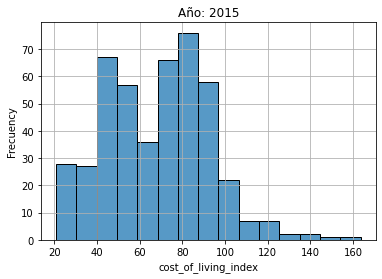

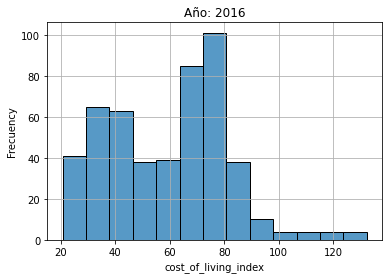

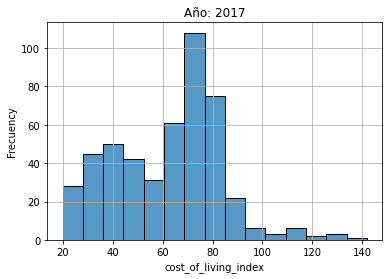

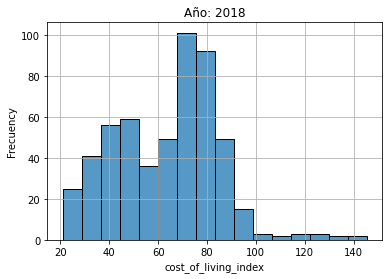

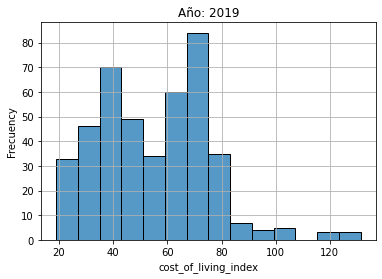

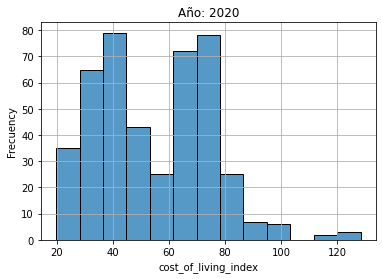

In [53]:
df_year = life_cost.groupby('year')
i = 1
for anio, grupo in df_year:
  x = (grupo['rank'].values) # Formato de vector
  y = (grupo['cost_of_living_index'].values)
  #plt.bar(x,y,color="black",alpha=0.6) #---> Cambiar aquí
  sns.histplot(grupo.cost_of_living_index)
  plt.grid()
  plt.xlabel("cost_of_living_index")
  plt.ylabel("Frecuency")
  plt.title("Año: "+str(anio))
  plt.show()

**Comenarios:** En los gráficos se puede apreciar que la gran mayoría de las ciudades tienen un costo de vida menor al índice 100, esto quiere decir que la ciudad de referencia, New York, es una de las ciudades que tienen un costo de vida más alto en el mundo, siendo superada por muy pocas ciudades, independiente del año. Además en todos los gráficos se ve que existe una curva muy pronunciada al inicio, es decir, esta muy cargado el gráfico hacia la izquierda y luego la curva decae más lentamente sobre el valor 80, lo que demuestra que existe un grupo reducido de ciudades con un gran costo de vida, en comparación al resto de las ciudades.

### Ejercicio 3.3 

Grafica el índice de restaurantes a través de los años para diez ciudades escogidas pseudo-aleatoriamente (variable `my_cities` de la celda siguiente) en un mismo gráfico. Recuerda escoger el tipo de gráfico adecuadamente.

¿Ves alguna relación? ¿Qué podrías decir del gráfico? ¿Por qué no graficar todas las ciudades en lugar de solo escoger algunas?

In [54]:
rol_seed = 201604608  # Escribe tu rol UTFSM sin número verificador
my_cities = life_cost["city"].drop_duplicates().sample(n=10, random_state=rol_seed).values
my_cities

array(['Spokane, WA, United States', 'Portland, OR, United States',
       'York, United Kingdom', 'Trento, Italy',
       'Milton Keynes, United Kingdom', 'Saint Helier, Jersey',
       'Birmingham, United Kingdom', 'Varna, Bulgaria',
       'West Palm Beach, FL, United States',
       'Savannah, GA, United States'], dtype=object)

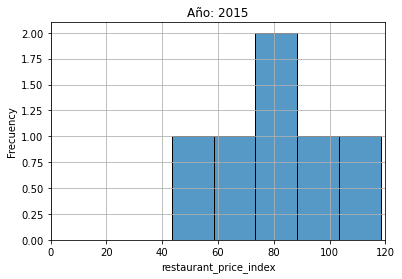

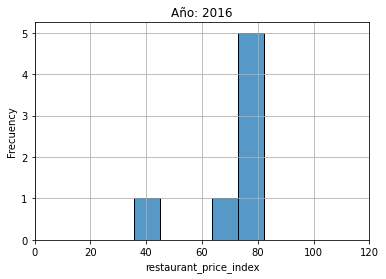

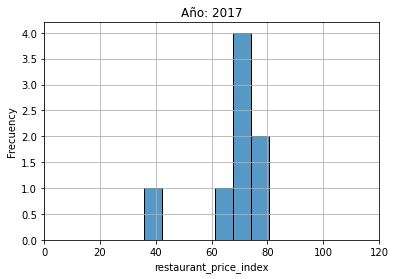

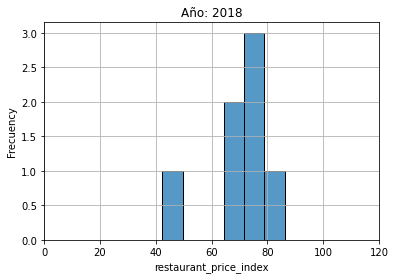

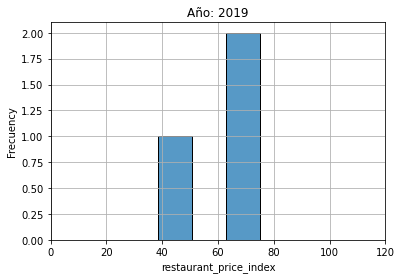

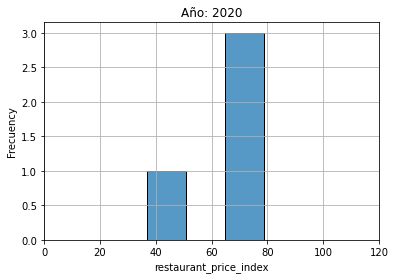

In [55]:
df_cities = life_cost[life_cost["city"].isin(my_cities)]
df_year_cities = df_cities.groupby('year')
for anio, grupo in df_year_cities:
  x = (grupo['rank'].values) # Formato de vector
  y = (grupo['restaurant_price_index'].values)
  #plt.bar(x,y,color="black",alpha=0.6)
  sns.histplot(grupo.cost_of_living_index)
  plt.grid()
  plt.ylabel("Frecuency")
  plt.xlabel("restaurant_price_index")
  plt.xlim((0,120))
  plt.title("Año: "+str(anio))
  plt.show()



**Comentarios:** En todos los gráficos se puede ver que hay una mayor distribución cerca de los valores de 40 y entre 60-80 (excepto para el año 2015), esto se relaciona al ver el histograma con las ciudades completas ya que estos gráficos en general, tienen peaks cerca de 80 y 40, por tanto tomar una menor cantidad de ciudades puede dar un primer indicio de como es la distribución y cuales son los valores más altos. Graficar todas las ciudades puede generar un costo computacional más alto, sin embargo, si la elección de las ciudades esta sesgada puede alterar la percepción del gráfico, tal como pasa en el año 2015, donde al graficar la lista reducida de ciudades ésta no coincide con el histograma de todas las ciudades para el mismo año.

### IV.- LearnPlatform

<img src="https://iltpp.org/wp-content/uploads/2020/11/LearnPlatform.png" width="480" height="360" align="center"/>

### Introducción

Nelson Mandela creía que la educación era el arma más poderosa para cambiar el mundo. Pero no todos los estudiantes tienen las mismas oportunidades de aprender. Es necesario promulgar políticas y planes efectivos para que la educación sea más equitativa, y tal vez su innovador análisis de datos ayude a revelar la solución.

La investigación actual muestra que los resultados educativos están lejos de ser equitativos. El desequilibrio se vio agravado por la pandemia de COVID-19. Existe una necesidad urgente de comprender y medir mejor el alcance y el impacto de la pandemia en estas inequidades.

La empresa de tecnología educativa LearnPlatform se fundó en 2014 con la misión de ampliar el acceso equitativo a la tecnología educativa para todos los estudiantes y profesores. Los distritos y estados utilizan el sistema integral de efectividad de la tecnología educativa de LearnPlatform para mejorar continuamente la seguridad, la equidad y la efectividad de su tecnología educativa. LearnPlatform lo hace generando una base de evidencia de lo que está funcionando y promulgándola en beneficio de los estudiantes, los profesores y los presupuestos.

En esta competencia de análisis, trabajará para descubrir tendencias en el aprendizaje digital. Logre esto con un análisis de datos sobre cómo el compromiso con el aprendizaje digital se relaciona con factores como la demografía del distrito, el acceso a la banda ancha y las políticas y eventos a nivel estatal / nacional. Luego, envíe un notebook de Kaggle para proponer su mejor solución a estas desigualdades educativas.

Sus presentaciones informarán las políticas y prácticas que cierran la brecha digital. Con una mejor comprensión de las tendencias de aprendizaje digital, puede ayudar a revertir la pérdida de aprendizaje a largo plazo entre los más vulnerables de Estados Unidos, haciendo que la educación sea más equitativa.

### Planteamiento del problema
La pandemia COVID-19 ha interrumpido el aprendizaje de más de 56 millones de estudiantes en los Estados Unidos. En la primavera de 2020, la mayoría de los gobiernos estatales y locales de los EE. UU. Cerraron las instituciones educativas para detener la propagación del virus. En respuesta, las escuelas y los maestros han intentado llegar a los estudiantes de forma remota a través de herramientas de aprendizaje a distancia y plataformas digitales. Hasta el día de hoy, las preocupaciones sobre la exacerbación de la brecha digital y la pérdida de aprendizaje a largo plazo entre los estudiantes más vulnerables de Estados Unidos continúan creciendo.

### Desafío
Los estudiantes deben explorar (1) el estado del aprendizaje digital en 2020 y (2) cómo la participación del aprendizaje digital se relaciona con factores como la demografía del distrito, el acceso a banda ancha y las políticas y eventos a nivel estatal/nacional.

Le recomendamos que oriente el análisis con preguntas relacionadas con los temas descritos anteriormente (en negrita). A continuación se muestran algunos ejemplos de preguntas que se relacionan con el planteamiento de nuestro problema:

* ¿Cuál es el panorama de la conectividad y el compromiso digitales en 2020?
* ¿Cuál es el efecto de la pandemia de COVID-19 en el aprendizaje en línea y a distancia, y cómo podría evolucionar también en el futuro?
* ¿Cómo cambia la participación de los estudiantes con los diferentes tipos de tecnología educativa durante el transcurso de la pandemia?
* ¿Cómo se relaciona la participación de los estudiantes con las plataformas de aprendizaje en línea con las diferentes geografías? ¿Contexto demográfico (por ejemplo, raza/etnia, ESL, discapacidad de aprendizaje)? Contexto de aprendizaje? ¿Estatus socioeconómico?
* ¿Se correlacionan ciertas intervenciones, prácticas o políticas estatales (por ejemplo, estímulo, reapertura, moratoria de desalojo) con el aumento o la disminución de la participación en línea?

### Evaluación


#### Claridad 

* ¿El autor presentó un hilo claro de preguntas o temas que motivaron su análisis?
* ¿El autor documentó por qué/cómo se eligió y utilizó un conjunto de métodos para su análisis?
* ¿Está documentado el notebook de una manera que sea fácilmente reproducible (p. Ej., Código, fuentes de datos adicionales, citas)?
* ¿El notebook contiene visualizaciones de datos claras que ayuden a comunicar de manera eficaz los hallazgos del autor tanto a expertos como a no expertos?

#### Precisión 

* ¿El autor procesó los datos (por ejemplo, fusionando) y/o fuentes de datos adicionales con precisión?
* ¿La metodología utilizada en el análisis es apropiada y razonable?
* ¿Son razonables y convincentes las interpretaciones basadas en el análisis y la visualización?

#### Creatividad 

* ¿El notebook ayuda al lector a aprender algo nuevo o lo desafía a pensar de una manera nueva?
* ¿El notebook aprovecha métodos novedosos y/o visualizaciones que ayudan a revelar información a partir de datos y/o comunicar hallazgos?
* ¿El autor utilizó fuentes de datos públicas adicionales en su análisis?

#### Hints

* Esto corresponde a un desafio de Kaggle ([link](https://www.kaggle.com/c/learnplatform-covid19-impact-on-digital-learning/overview/description)).
* La descripción de las columnas, lo pueden encontrar en el siguiente [link](https://www.kaggle.com/c/learnplatform-covid19-impact-on-digital-learning/data).
* Los datos del desafio se encuentran en el siguiente [link](https://drive.google.com/drive/folders/15t3gGwGNazuW5Zs4Mj_9_d2sMJdJg7qo).
* A modo de inspiración, pueden ocupar algunos gráficos de otros participantes del desafío ([link](https://www.kaggle.com/c/learnplatform-covid19-impact-on-digital-learning/code)).

In [56]:
!pip install missingno
!pip install wordcloud

In [57]:
# libraries
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime
import missingno as msno
from wordcloud import WordCloud

In [58]:
# read data

## products dataset
path = 'data/learnplatform-covid19-impact-on-digital-learning/'
products_df = pd.read_csv(path + "products_info.csv")
products_df.columns = [x.lower().replace(' ','_') for x in products_df.columns]
products_df

,lp_id,url,product_name,provider/company_name,sector(s),primary_essential_function
0,13117,https://www.splashmath.com,SplashLearn,StudyPad Inc.,PreK-12,LC - Digital Learning Platforms
1,66933,https://abcmouse.com,ABCmouse.com,"Age of Learning, Inc",PreK-12,LC - Digital Learning Platforms
2,50479,https://www.abcya.com,ABCya!,"ABCya.com, LLC",PreK-12,"LC - Sites, Resources & Reference - Games & Si..."
3,92993,http://www.aleks.com/,ALEKS,McGraw-Hill PreK-12,PreK-12; Higher Ed,LC - Digital Learning Platforms
4,73104,https://www.achieve3000.com/,Achieve3000,Achieve3000,PreK-12,LC - Digital Learning Platforms
...,...,...,...,...,...,...
367,88065,https://dochub.com/,DocHub,DocHub,PreK-12; Higher Ed; Corporate,SDO - Other
368,37805,http://google.com/slides/about/,Google Slides,Google LLC,PreK-12; Higher Ed; Corporate,LC - Content Creation & Curation
369,32555,http://www.innersloth.com/gameAmongUs.php,Among Us,InnerSloth,PreK-12; Higher Ed,"LC - Sites, Resources & Reference - Games & Si..."
370,87841,http://edpuzzle.com,Edpuzzle - Free (Basic Plan),EDpuzzle Inc.,NaN,NaN


In [59]:
products_df.info() # información del dataframe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 372 entries, 0 to 371
Data columns (total 6 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   lp_id                       372 non-null    int64 
 1   url                         372 non-null    object
 2   product_name                372 non-null    object
 3   provider/company_name       371 non-null    object
 4   sector(s)                   352 non-null    object
 5   primary_essential_function  352 non-null    object
dtypes: int64(1), object(5)
memory usage: 17.6+ KB


**Contenido de la Tabla:** El DataFrame tiene 372 filas y 6 Columnas. Cada una de estas columnas representa:


*   **lp_id**: Identificador del producto
*   **url:** Enlace de la página web del producto
*   **product_name:** Nombre del producto
*   **provider/company_name:** Nombre de la compañia proveedora
*   **sector(s):** Nivel de educación donde el producto es utilizado
*   **primary_essential_function:** Función del producto, esta función es etiquetada primero con una de las 3 variables que se describen a continuación:
  1.   LC: Aprendizaje y plan de estudios
  2.   CM: Gestión del salón de clases
  3.   SDO: Operaciones escolares y del distrito

Posteriormente, lleva una segunda etiqueta con un set de sub-categorias.

Según la información obtenida, solo la columna "lp_id" es numérica, mientras que las otras son tipo objeto, donde en la tabla se puede ver que son principalmente texto.







In [60]:
## districts dataset
districts_df = pd.read_csv(path +"districts_info.csv")
districts_df

,district_id,state,locale,pct_black/hispanic,pct_free/reduced,county_connections_ratio,pp_total_raw
0,8815,Illinois,Suburb,"[0, 0.2[","[0, 0.2[","[0.18, 1[","[14000, 16000["
1,2685,NaN,NaN,NaN,NaN,NaN,NaN
2,4921,Utah,Suburb,"[0, 0.2[","[0.2, 0.4[","[0.18, 1[","[6000, 8000["
3,3188,NaN,NaN,NaN,NaN,NaN,NaN
4,2238,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
228,9515,New York,Rural,"[0, 0.2[","[0.4, 0.6[","[0.18, 1[","[18000, 20000["
229,8103,Tennessee,Rural,"[0.2, 0.4[",NaN,"[0.18, 1[","[8000, 10000["
230,4929,Virginia,Rural,"[0, 0.2[","[0.4, 0.6[","[0.18, 1[","[12000, 14000["
231,7975,California,City,"[0.6, 0.8[","[0.6, 0.8[","[0.18, 1[",NaN


In [61]:
districts_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 233 entries, 0 to 232
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   district_id               233 non-null    int64 
 1   state                     176 non-null    object
 2   locale                    176 non-null    object
 3   pct_black/hispanic        176 non-null    object
 4   pct_free/reduced          148 non-null    object
 5   county_connections_ratio  162 non-null    object
 6   pp_total_raw              118 non-null    object
dtypes: int64(1), object(6)
memory usage: 12.9+ KB


**Información del DataFrame:** El data tiene 233 filas y 7 columnas. En las columnas se muestran 7 variables, las cuales se describen a continuación:


*   **district_id:** Identificador del distrito.
*   **State:** Estado del distrito.
*   **locale:** Clasificación regional de Estados Unidos, siendo catalogada como: Ciudad, sub-urbano, pueblo y rural.
*   **pct_black/hispanic:** Porcentaje de estudiantes catalogados como "negros" o "hispanos".
*   **pct_free/reduced:** Porcentaje de estudiantes con beneficio de almuerzos gratis o con precio reducido.
*   **county_connections_ratio:** radio de conexión.
*   **pp_total_raw:** Valor medio del gasto escolar en un distrito.

Se muestra que el dataframe tiene una gran cantidad de datos "nulos".


In [62]:
## engagement dataset

path = 'data/learnplatform-covid19-impact-on-digital-learning/' 
all_files = glob.glob(path + "/*.csv")
li = []
for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    district_id = filename.split("/")[-1].split(".")[0]
    df["district_id"] = district_id
    li.append(df)
engagement_df = pd.concat(li)
engagement_df = engagement_df.reset_index(drop=True)
engagement_df

,district_id,state,locale,pct_black/hispanic,pct_free/reduced,county_connections_ratio,pp_total_raw,LP ID,URL,Product Name,Provider/Company Name,Sector(s),Primary Essential Function
0,learnplatform-covid19-impact-on-digital-learni...,Illinois,Suburb,"[0, 0.2[","[0, 0.2[","[0.18, 1[","[14000, 16000[",NaN,NaN,NaN,NaN,NaN,NaN
1,learnplatform-covid19-impact-on-digital-learni...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,learnplatform-covid19-impact-on-digital-learni...,Utah,Suburb,"[0, 0.2[","[0.2, 0.4[","[0.18, 1[","[6000, 8000[",NaN,NaN,NaN,NaN,NaN,NaN
3,learnplatform-covid19-impact-on-digital-learni...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,learnplatform-covid19-impact-on-digital-learni...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
600,learnplatform-covid19-impact-on-digital-learni...,NaN,NaN,NaN,NaN,NaN,NaN,88065.0,https://dochub.com/,DocHub,DocHub,PreK-12; Higher Ed; Corporate,SDO - Other
601,learnplatform-covid19-impact-on-digital-learni...,NaN,NaN,NaN,NaN,NaN,NaN,37805.0,http://google.com/slides/about/,Google Slides,Google LLC,PreK-12; Higher Ed; Corporate,LC - Content Creation & Curation
602,learnplatform-covid19-impact-on-digital-learni...,NaN,NaN,NaN,NaN,NaN,NaN,32555.0,http://www.innersloth.com/gameAmongUs.php,Among Us,InnerSloth,PreK-12; Higher Ed,"LC - Sites, Resources & Reference - Games & Si..."
603,learnplatform-covid19-impact-on-digital-learni...,NaN,NaN,NaN,NaN,NaN,NaN,87841.0,http://edpuzzle.com,Edpuzzle - Free (Basic Plan),EDpuzzle Inc.,NaN,NaN


In [63]:
engagement_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 605 entries, 0 to 604
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   district_id                 605 non-null    object 
 1   state                       176 non-null    object 
 2   locale                      176 non-null    object 
 3   pct_black/hispanic          176 non-null    object 
 4   pct_free/reduced            148 non-null    object 
 5   county_connections_ratio    162 non-null    object 
 6   pp_total_raw                118 non-null    object 
 7   LP ID                       372 non-null    float64
 8   URL                         372 non-null    object 
 9   Product Name                372 non-null    object 
 10  Provider/Company Name       371 non-null    object 
 11  Sector(s)                   352 non-null    object 
 12  Primary Essential Function  352 non-null    object 
dtypes: float64(1), object(12)
memory us

**Información del DataFrame:** El data tiene 605 filas y 13 columnas. La descripción de las columnas es la misma de los dataframe anteriores. El nombre de los archivos ".csv" corresponde al nombre de "district_id". Estos archivos tienen 3 columnas: time, lp_id, pct_access y engagement_index. Vemos que el dataframe puede ser conectado a estos archivos a través de la columna lp_id

**Identificador de datos No Nulos en districts_df**

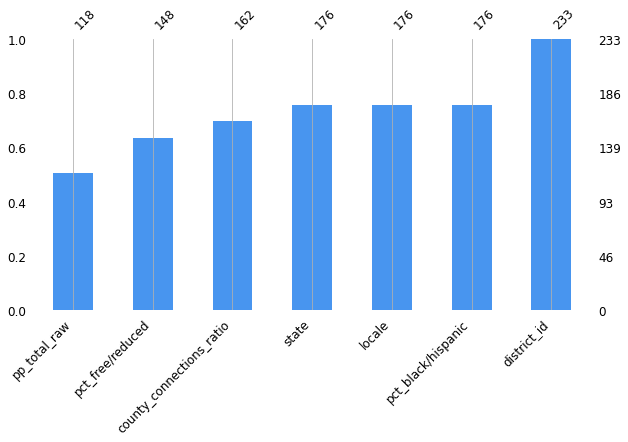

In [64]:
msno.bar(districts_df,color='#4895ef', sort="ascending", figsize=(10,5), fontsize=12)
plt.grid()
plt.show()

### **Visualización de datos:**

**¿Cómo es la distribución de la clasificación regional en Estados Unidos?**

In [65]:
districts_df['locale'].value_counts()

Suburb    104
Rural      33
City       29
Town       10
Name: locale, dtype: int64

Text(0, 0.5, 'Locale Data')

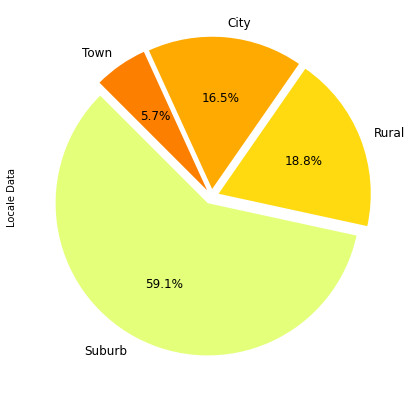

In [66]:
districts_df['locale'].value_counts().plot(kind='pie',
                                           explode=[0.05, 0.05, 0.05, 0.05],
                                           fontsize=12,
                                           autopct='%3.1f%%',
                                           figsize=(7,7),
                                           startangle=135,
                                           cmap='Wistia')
plt.ylabel("Locale Data")

El gráfico muestra que la clasificación regional sub-urbano o suburbios tiene un mayor porcentaje en el país. También se puede ver como es la distribución entre cada estado, y la clasificación local en cada una de ellas.

Text(0.5, 1.0, 'Distribución entre Estado y Clasificación Local')

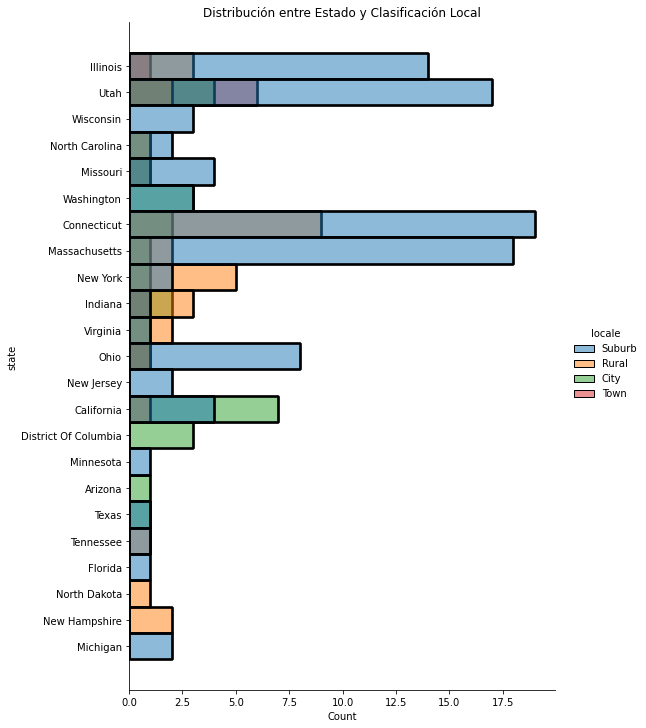

In [67]:

sns.displot(data=districts_df.loc[lambda x: x.state.notnull()], y='state', hue='locale' ,height=10, aspect=0.8)
plt.title("Distribución entre Estado y Clasificación Local")

In [68]:
districts_df.loc[lambda x: x.state.notnull()]

,district_id,state,locale,pct_black/hispanic,pct_free/reduced,county_connections_ratio,pp_total_raw
0,8815,Illinois,Suburb,"[0, 0.2[","[0, 0.2[","[0.18, 1[","[14000, 16000["
2,4921,Utah,Suburb,"[0, 0.2[","[0.2, 0.4[","[0.18, 1[","[6000, 8000["
5,5987,Wisconsin,Suburb,"[0, 0.2[","[0, 0.2[","[0.18, 1[","[10000, 12000["
6,3710,Utah,Suburb,"[0, 0.2[","[0.4, 0.6[","[0.18, 1[","[6000, 8000["
7,7177,North Carolina,Suburb,"[0.2, 0.4[","[0.2, 0.4[","[0.18, 1[","[8000, 10000["
...,...,...,...,...,...,...,...
228,9515,New York,Rural,"[0, 0.2[","[0.4, 0.6[","[0.18, 1[","[18000, 20000["
229,8103,Tennessee,Rural,"[0.2, 0.4[",NaN,"[0.18, 1[","[8000, 10000["
230,4929,Virginia,Rural,"[0, 0.2[","[0.4, 0.6[","[0.18, 1[","[12000, 14000["
231,7975,California,City,"[0.6, 0.8[","[0.6, 0.8[","[0.18, 1[",NaN


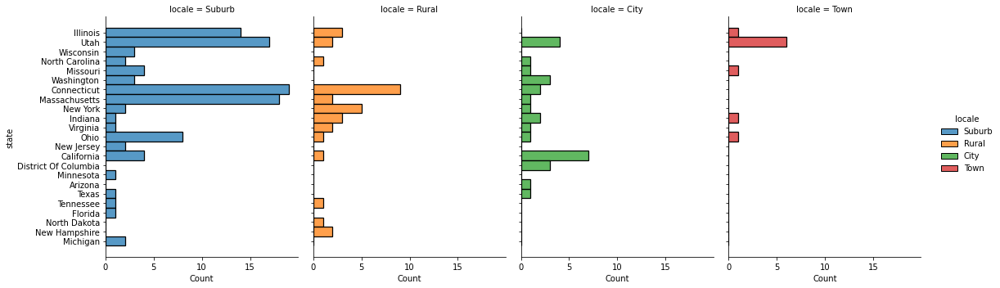

In [69]:
sns.displot(data=districts_df.loc[lambda x: x.state.notnull()], y='state', hue='locale', col='locale', height=5, aspect=0.8)

En el primer gráfico se puede comparar el total de elementos de la clasificación regional entre todos los estados, donde los que más tienen son los estados de Illinois, Utah, Connecticut y Massachusetts. Sin embargo, estos estados tienen una mayor cantidad de zonas locales debido a su gran proporción de suburbios, ya que se se analiza el segundo gráfico se ve claramente el aporte de esta clasificación en estos 4 Estados. Por otro lado, la mayor cantidad de zonas rurales estan en Connecticut, la mayor cantidad de Ciudades están en California y la mayor cantidad de pueblos están en Utah. Por último, podemos comparar la cantidad de distritos totales en Estados Unidos.

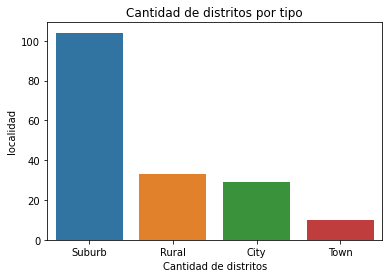

In [70]:

sns.countplot(x = "locale", data = districts_df,order = districts_df["locale"].value_counts().index[:300]).set(xlabel = "Cantidad de distritos", ylabel = "localidad")
plt.title("Cantidad de distritos por tipo")
plt.show()

**¿Qué porcentaje de estudiantes calificados como "negros" o "hispanos" hay en cada localidad y Estado?**


Primero es importante conocer como es su relación de distribución.

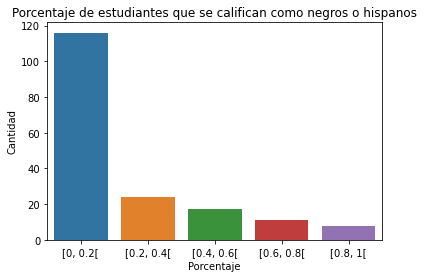

In [71]:
sns.countplot(x = "pct_black/hispanic",data = districts_df,order = districts_df["pct_black/hispanic"].value_counts().index)
plt.xlabel('Porcentaje')
plt.ylabel('Cantidad')
plt.title("Porcentaje de estudiantes que se califican como negros o hispanos")
plt.show()

Text(0, 0.5, 'Cantidad')

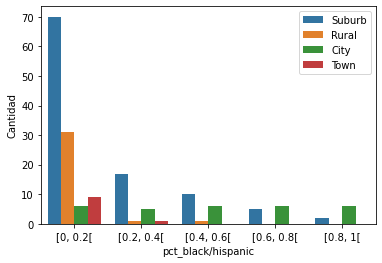

In [72]:
sns.countplot(data=districts_df, x='pct_black/hispanic',
             order = districts_df['pct_black/hispanic'].value_counts().index,
             hue='locale')
plt.legend(loc="upper right")
plt.ylabel('Cantidad')

Una de las cosas a resaltar en este gráfico, es que en los distritos donde el porcentaje de estudiantes calificados como "negros" o "hispaños" es muy alta (60-100 %) solo se encuentra en las localidades de suburbios y ciudades, no así en las zonas rurales o pueblos, aunque la cantidad de datos de pueblos es baja, si en las zonas rurales existe una baja taza de estudiantes calificados como "negros" o "hispanos". Por último, podemos estudiar como es la distribución media en cada uno de los estados.

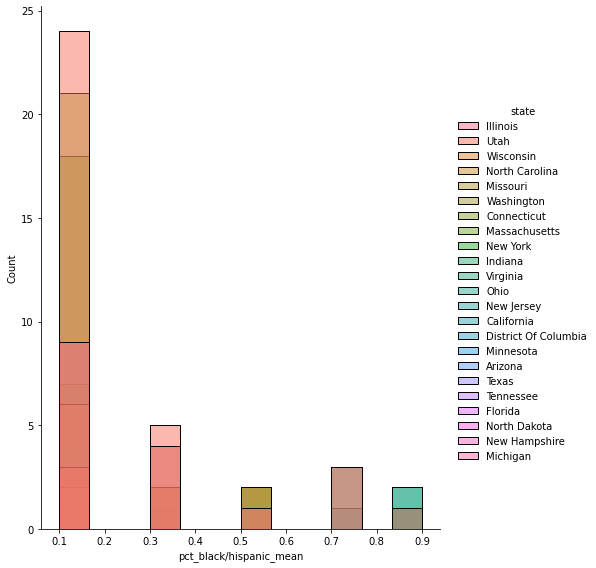

In [73]:
# Remueve los simbolos y separa los números
pct_black_hispanic = districts_df['pct_black/hispanic'].str.split(',', n=1, expand=True)
districts_df['pct_black'] = pct_black_hispanic[0].str.replace('[','',regex=True)
districts_df['hispanic'] = pct_black_hispanic[1].str.replace('[','',regex=True)
districts_df['pct_black'] = pd.to_numeric(districts_df['pct_black'])
districts_df['hispanic'] = pd.to_numeric(districts_df['hispanic'])
districts_df['pct_black/hispanic_mean'] = (districts_df['pct_black'] + districts_df['hispanic'])/2

sns.displot(data=districts_df, x='pct_black/hispanic_mean', hue='state', height=8, aspect=.8)

Se puede ver que la mayoría de los Estados tiene una baja proporción de estudiantes calificados como "negros" o "hispanos" ya que los datos están muy cargados al sector izquierdo (bajo % de estudiantes calificados), a excepción de un estado.

**¿Cuál es la función primaria esencial más utilizada?**

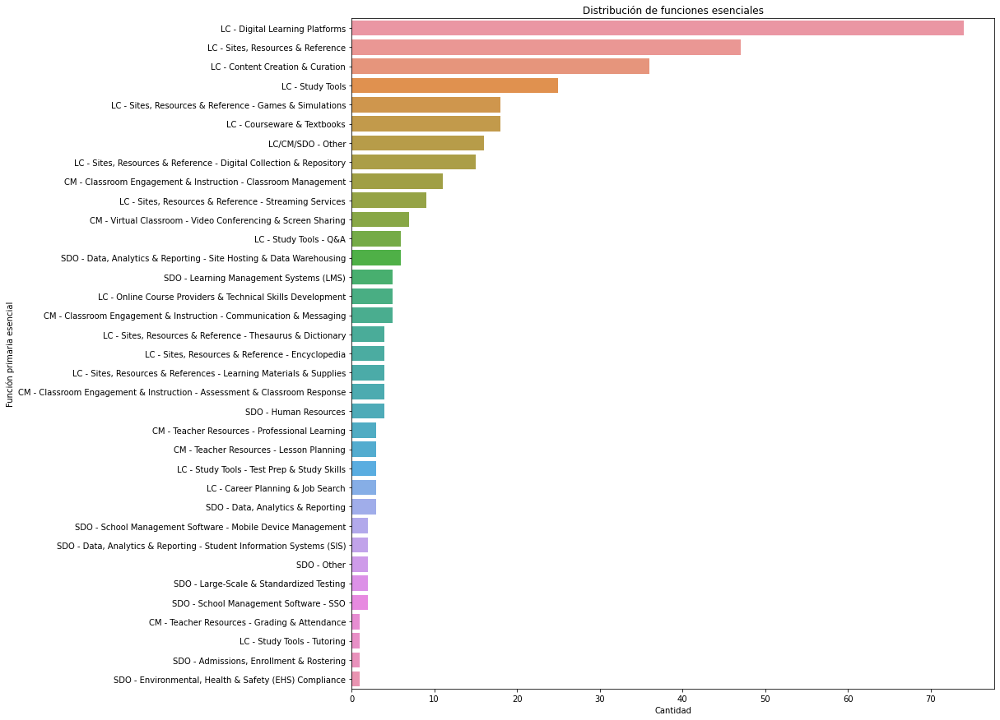

In [74]:
plt.figure(figsize=(14, 15))
sns.countplot(y = "primary_essential_function", data = products_df,order = products_df["primary_essential_function"].value_counts().index[:500])
plt.xlabel('Cantidad')
plt.ylabel('Función primaria esencial')
plt.title("Distribución de funciones esenciales")
plt.show()

Del gráfico se observa que las 8 funciones con mayor registro pertenecen a la función "aprendizaje y plan de estudios", y dentro de esta la función de aprendizaje en plataformas digitales es la más utilizada. Por otro lado, las funciones asociadas a las operaciones escolares como el manejo de software, manejo de sistemas de información y cumplimiento de medio ambiente, salud y seguridad son las menos utilizadas

**¿En que Estados y distritos se presenta una mayor proporción de beneficios de alimentación?**

En primer lugar estudiamos la distribución porcentual con respecto a los distritos

In [75]:
pct_free_reduced = districts_df['pct_free/reduced'].str.split(",",n=1,expand=True)

In [76]:
districts_df['pct_free']=pct_free_reduced[0].str.replace('[','',regex=True)
districts_df['pct_reduced']= pct_free_reduced[1].str.replace('[','',regex=True) #reemplaza el []
districts_df['pct_free']=pd.to_numeric(districts_df['pct_free']) # convierte a valores numéricos
districts_df['pct_reduced']=pd.to_numeric(districts_df['pct_reduced'])
districts_df['pct_free/reduced']=(districts_df['pct_free'] + districts_df['pct_reduced'])/2 # suma ambos
districts_df['pct_free/reduced'].value_counts() #cuenta las proporciones

0.3    48
0.1    46
0.5    37
0.7    13
0.9     4
Name: pct_free/reduced, dtype: int64

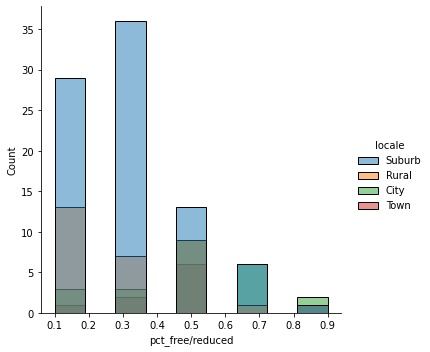

In [77]:
sns.displot(data=districts_df, kind='hist', x='pct_free/reduced', hue='locale', aspect=1)

En el gráfico se ve que los suburbios tienen un muy bajo porcentaje de beneficios de almuerzo gratis o con descuento, siendo este valor menor al 50%, además el gráfico esta muy cargado a la izquierda, por lo que en general, el porcentaje de beneficios de almuerzo es bajo. Por otro lado, viendo los valores más altos se aprecia que existe una mezcla entre suburios y la ciudad. La distribución por Estados se muestra en el siguiente gráfico.

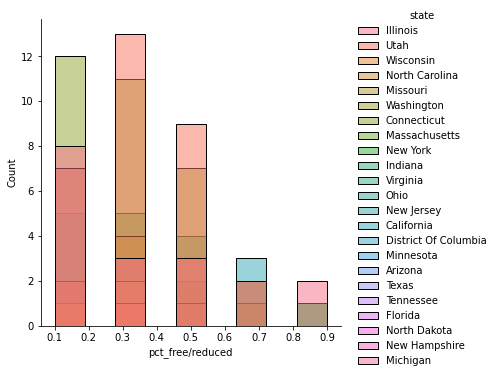

In [78]:
sns.displot(data=districts_df, kind='hist', x='pct_free/reduced', hue='state', aspect=1)

En general los Estados tienen una distribución de beneficios de almuerzo muy cargada hacia la izquierda, es decir, entre un 0 y 50%, sin embargo, algunos Estados destacan con un gran porcentaje de beneficios.

**¿Que compañia ofrece los productos educacionales más utilizados?

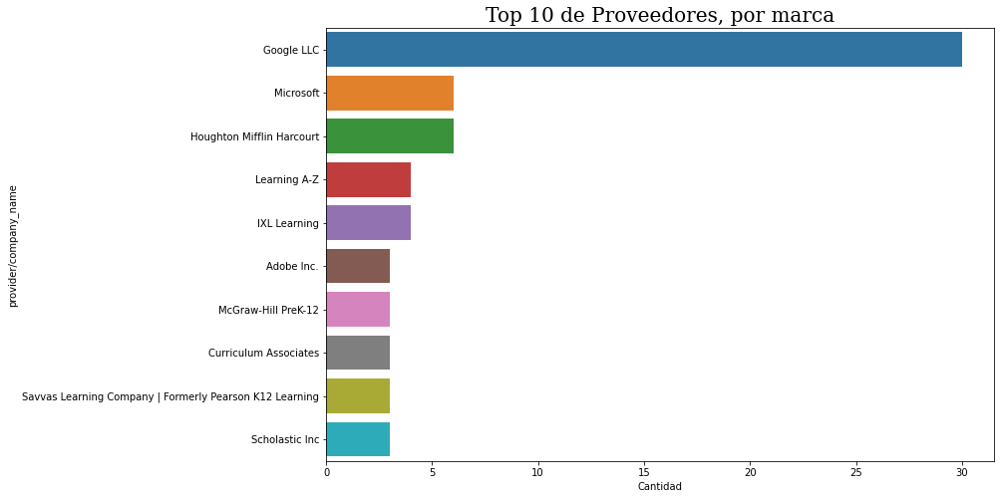

In [79]:
plt.figure(figsize=(12, 8))
sns.countplot(y = "provider/company_name", data = products_df,order = products_df["provider/company_name"].value_counts().index[:10]).set(xlabel = "Cantidad", ylabel = "provider/company_name")
plt.title("Top 10 de Proveedores, por marca",font="Serif", size=20)
plt.show()

La marca que domina entre los proveedores es Google LLC, más aún la diferencia entre esta marca y las que siguen es muy amplia.

**¿En qué nivel educativo es donde más se utilizan estos productos?

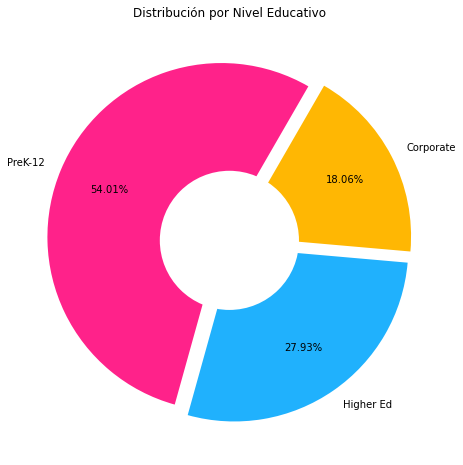

In [80]:
d1=d2=d3=0
for s in products_df["sector(s)"]:
    if(not pd.isnull(s)):
        s = s.split(";")
        for i in range(len(s)):
            sub = s[i].strip()
            if(sub == 'PreK-12'): d1+=1
            if(sub == 'Higher Ed'): d2+=1
            if(sub == 'Corporate'): d3+=1

fig, ax  = plt.subplots(figsize=(16, 8))
plt.title('Distribución por Nivel Educativo')
explode = (0.05, 0.05, 0.05)
labels = ['PreK-12','Higher Ed','Corporate']
sizes = [d1,d2, d3]
ax.pie(sizes, explode=explode,startangle=60, labels=labels,autopct='%1.2f%%', pctdistance=0.7, colors=["#ff228a","#20b1fd","#ffb703"])
ax.add_artist(plt.Circle((0,0),0.4,fc='white'))
plt.show()

Con un 54.01%, el nivel educativo PreK-12 es donde más se utilizan los productos.

¿Cuál es el gasto económico medio en los distritos?

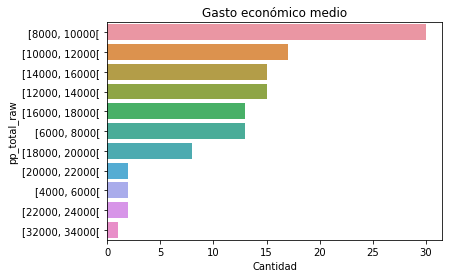

In [81]:
sns.countplot(y = "pp_total_raw",data = districts_df,order = districts_df["pp_total_raw"].value_counts().index).set(ylabel = "pp_total_raw", xlabel = "Cantidad")
plt.title("Gasto económico medio")
plt.show()

En el gráfico se ve que el gasto económico en general está centre los 8000-16000, donde en una muy pequeña proporción, el gasto en los distritos puede estar bajo los 6000, o sobre los 20000.

**¿Como ha sido el impacto de la pandemia de Covid-19 en el modelo educacional?**

En general, existe una desigualdad entre los distintos Estados o distritos, pero lo que si es cierto es que la pandemia generó un gran impacto a nivel educacional, donde fue necesario adaptarse rápidamente a los medios digitales para no aumentar la desigualdad educacional existente no solo en Estados Unidos, sino en la mayoría de los países. En los gráficos se puede apreciar que hay ciertas funciones, o ciertas marcas que son preferidas entre los estudiantes, en el caso de nuestro país algunas de las marcas más conocidas pueden ser Google o Microsoft, marcas que también son las más utilizadas en Estados Unidos.

El impacto de la tecnología y servicios digitales probablemente no quedará en el pasado una vez que la pandemia termine, este modelo educativo probablemente se convierta en un instrumento que será utilizado regularmente por los estudiantes, donde seguramente irá en aumento con el tiempo.